<table align="right">
    <tr>
        <td>
            <img src= "https://www.insper.edu.br/wp-content/themes/insper/dist/image/logo.png">
        </td>
    </tr>
</table>

# Atividade Integradora

<table align="right">
    <tr>
        <td>
            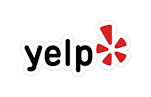
        </td>
    </tr>
</table>

- Big Data e Computação em Nuvem / Modelos Preditivos Avançados

Insper - Jul/2020 - São Paulo, Brasil

* Autores:
    - Marcelo Franceschini
    - Rafael Costa
    - Viviane Sanchez

# Introdução

Foram selecinados dados de usuários e estabelecimentos abertos em Toronto para treinar um modelo de classificação binária das notas das avaliações e assim *prever se a nota de um estabelecimento que o usuário ainda não avaliou seria boa ou ruim*. A recomendação é dada conforme a maior probabilidade de o usuário dar uma nota alta para aquele lugar.

## Objetivo

**Criar um sistema de recomendação de estabelecimentos bem avaliados em linha com o perfil do usuário.**

Os dados das seguintes bases fornecidas pelp Yelp para estudos acadêmicos serão analisados

- Business - informações e atributos dos estabelecimentos
- Users - Informações sobre o perfil do usuário no Yelp
- Reviews - Texto e atributos de avaliações dos estabelecimentos criadas pelos usuários
- Tips - Dicas adicionais e atributos deixados pelos usuários
- Check-ins - Histórico de check-ins por estabelecimento

- [Fonte de dados](https://www.yelp.com/dataset)

# Ambiente Spark

A seguir estão as confirgurações para o ambiente Spark. Como o notebook foi compartilhado por [GitHub](https://github.com/sanchezvivi/pads-yelp) e processado em máquinas diferentes, foram mantidas as diferentes configurações necessárias.

In [1]:
#import findspark as fs
from pyspark.sql import SparkSession

In [117]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud, ImageColorGenerator
import os
from pyspark.sql import SparkSession
# from pyspark.sql.types import *
from pyspark.sql import functions as f
from pyspark.sql.window import Window
from pyspark.ml.feature import StopWordsRemover
from pyspark.sql.functions import col, count, explode, split, array, concat_ws
from pyspark.sql.types import ArrayType, IntegerType
import pandas as pd
import seaborn as sns
#from tqdm.notebook import tqdm
sns.set(style="ticks", palette="pastel")
%matplotlib inline

In [4]:
#Mac Local (Viviane)
#spark_location='/Users/vivi/server/spark' # Set your own
#java8_location= '/Library/Java/JavaVirtualMachines/jdk1.8.0_251.jdk/Contents/Home/' # Set your own
#os.environ['JAVA_HOME'] = java8_location
#fs.init(spark_home=spark_location)

In [5]:
#datapath = 'C:\\Users\\RuWindows\\Desktop\\PI\\yelp_dataset\\' #Marcelo
datapath = '../data/yelp' #servidor AWS
#datapath = 'data' #Viviane

In [17]:
#files = sorted(os.listdir(datapath))
#files

In [18]:
#!head data/yelp_academic_dataset_review.json

In [6]:
# Spark Session
spark = SparkSession.builder \
                    .master('local[*]') \
                    .appName('Integradora Yelp') \
                    .config("spark.ui.port", "4060") \
                    .getOrCreate()

In [20]:
#spark = SparkSession.builder \
#            .master('local[8]') \
#            .appName('Yelp Integradora') \
#            .getOrCreate()

In [7]:
sc = spark.sparkContext

In [8]:
spark#.stop()

http://3.229.186.123:4060/

## Importando as Bases Origem - Raw

- A princípio todas as bases foram importadas para análise e entendimento de oportunidades de análise.

In [9]:
usr_raw = spark.read.json(datapath+'/yelp_academic_dataset_user.json')
rv_raw = spark.read.json(datapath+'/yelp_academic_dataset_review.json')
bz_raw = spark.read.json(datapath+'/yelp_academic_dataset_business.json')
tp_raw = spark.read.json(datapath+'/yelp_academic_dataset_tip.json')
ch_raw = spark.read.json(datapath+'/yelp_academic_dataset_checkin.json')

In [10]:
# Visualizando Estrutura
#bz_raw.printSchema()

# Tratamento das bases

## Check-ins

- Explosão das datas na base de Check-ins para análise dos principais dias e horários de movimento nos restaurantes.

In [11]:
ch = ch_raw.withColumn('dt', f.explode(f.split(f.col('date'),', ')))

In [12]:
ch_raw.show()

+--------------------+--------------------+
|         business_id|                date|
+--------------------+--------------------+
|--1UhMGODdWsrMast...|2016-04-26 19:49:...|
|--6MefnULPED_I942...|2011-06-04 18:22:...|
|--7zmmkVg-IMGaXbu...|2014-12-29 19:25:...|
|--8LPVSo5i0Oo61X0...| 2016-07-08 16:43:30|
|--9QQLMTbFzLJ_oT-...|2010-06-26 17:39:...|
|--9e1ONYQuAa-CB_R...|2010-02-08 05:56:...|
|--DaPTJW3-tB1vP-P...|2012-06-03 17:46:...|
|--DdmeR16TRb3LsjG...|2012-11-02 21:26:...|
|--EF5N7P70J_UYBTP...|2018-05-25 19:52:...|
|--EX4rRznJrltyn-3...|2010-02-26 17:05:...|
|--FBCX-N37CMYDfs7...|2010-05-31 07:57:...|
|--FLdgM0GNpXVMn74...|2012-10-23 18:47:...|
|--FnvijzY20d1nk9H...|2019-09-19 02:42:...|
|--GM_ORV2cYS-h38D...|2011-09-11 18:16:...|
|--I7YYLada0tSLkOR...|2014-11-07 00:51:...|
|--KCl2FvVQpvjzmZS...|2011-07-29 16:53:...|
|--KQsXc-clkO7oHRq...|2010-05-02 23:57:...|
|--Ni3oJ4VOqfOEu7S...| 2019-06-07 17:54:58|
|--Rsj71PBe31h5Ylj...|2011-12-15 18:09:...|
|--S62v0QgkqQaVUhF...|2010-12-25

In [13]:
ch.createOrReplaceTempView('ch')

- Transformação da data em unidades de tempo para análise

In [14]:
ch1 = spark.sql('''
            SELECT business_id, dt,
            DATE(dt) AS date,
            DAYOFWEEK(dt) AS dow,
            MONTH(dt) AS month,
            YEAR(dt) AS year,
            HOUR(dt) AS hour,
            DAY(dt) AS day
            
            FROM ch
            
            ''')

In [15]:
ch1.show()

+--------------------+-------------------+----------+---+-----+----+----+---+
|         business_id|                 dt|      date|dow|month|year|hour|day|
+--------------------+-------------------+----------+---+-----+----+----+---+
|--1UhMGODdWsrMast...|2016-04-26 19:49:16|2016-04-26|  3|    4|2016|  19| 26|
|--1UhMGODdWsrMast...|2016-08-30 18:36:57|2016-08-30|  3|    8|2016|  18| 30|
|--1UhMGODdWsrMast...|2016-10-15 02:45:18|2016-10-15|  7|   10|2016|   2| 15|
|--1UhMGODdWsrMast...|2016-11-18 01:54:50|2016-11-18|  6|   11|2016|   1| 18|
|--1UhMGODdWsrMast...|2017-04-20 18:39:06|2017-04-20|  5|    4|2017|  18| 20|
|--1UhMGODdWsrMast...|2017-05-03 17:58:02|2017-05-03|  4|    5|2017|  17|  3|
|--1UhMGODdWsrMast...|2019-03-19 22:04:48|2019-03-19|  3|    3|2019|  22| 19|
|--6MefnULPED_I942...|2011-06-04 18:22:23|2011-06-04|  7|    6|2011|  18|  4|
|--6MefnULPED_I942...|2011-07-23 23:51:33|2011-07-23|  7|    7|2011|  23| 23|
|--6MefnULPED_I942...|2012-04-15 01:07:50|2012-04-15|  1|    4|2

In [16]:
ch1.createOrReplaceTempView('ch1')

In [17]:
ch2 = spark.sql('''
            SELECT  business_id, year, month, dow, day,
                    COUNT(date) AS count
            
            FROM ch1
            
            GROUP BY business_id, year, month, dow, day
            ORDER BY count DESC
                 
            ''')

In [18]:
ch2.createOrReplaceTempView('ch2')

### Analisando o movimento de um estabelecimento

- Como exemplo, foi selecionado aleatóriamente um estabelecimento de Toronto. A seguir é analisada a quantidade de check-ins por mês e dia da semana.

In [19]:
df = spark.sql('''
            SELECT *
            FROM ch2

            WHERE business_id = 'BxCzy1WOVxOrr_G7V4BIvg'
            
            ''').toPandas()

In [20]:
df2 = df.groupby(['month','dow'])['count'].sum().unstack('dow').fillna(0)   

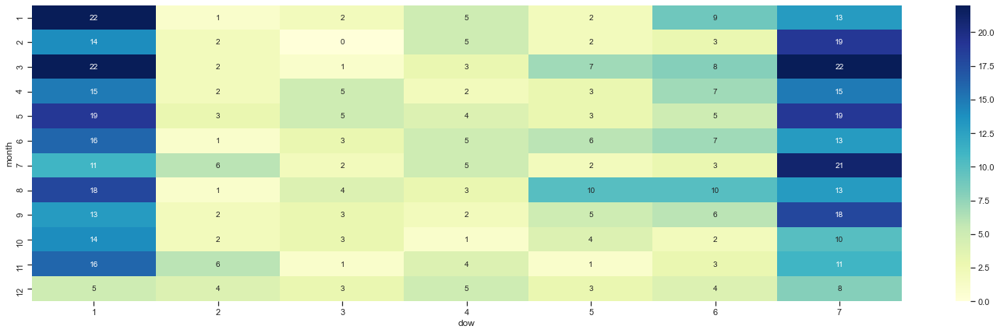

In [21]:
plt.figure(figsize = (25,7))
sns.heatmap(data = df2, cmap="YlGnBu", annot = True)

Pelo gráfico, verifica-se que o local é mais movimentado entre janeiro e março, principalmente aos finais de semana (dias 7 e 1). Para a modelagem, o ideal seria utilizar a moda (valor mais frequente) ou mediana dos check-ins, mas não é possível calcular com processento paralelo. A média pode não ser representativa, pois o pico de movimento está concentrado nos finais de semana. 

## Tips

- No início do estudo consideramos a utilização das informações da base Tips.

In [23]:
tp_raw.createOrReplaceTempView('tp')

In [24]:
tp_raw.show()

+--------------------+----------------+-------------------+--------------------+--------------------+
|         business_id|compliment_count|               date|                text|             user_id|
+--------------------+----------------+-------------------+--------------------+--------------------+
|UYX5zL_Xj9WEc_Wp-...|               0|2013-11-26 18:20:08|Here for a quick mtg|hf27xTME3EiCp6NL6...|
|Ch3HkwQYv1YKw_FO0...|               0|2014-06-15 22:26:45|Cucumber strawber...|uEvusDwoSymbJJ0au...|
|rDoT-MgxGRiYqCmi0...|               0|2016-07-18 22:03:42|Very nice good se...|AY-laIws3S7YXNl_f...|
|OHXnDV01gLokiX1EL...|               0|2014-06-06 01:10:34|It's a small plac...|Ue_7yUlkEbX4AhnYd...|
|GMrwDXRlAZU2zj5nH...|               0|2011-04-08 18:12:01|8 sandwiches, $24...|LltbT_fUMqZ-ZJP-v...|
|ALwAlxItASeEs2vYA...|               0|2015-05-20 20:17:38|Great ramen! Not ...|HHNBqfbDR8b1iq-QG...|
|d_L-rfS1vT3JMzgCU...|               0|2014-09-01 01:23:48|Cochinita Pibil w...|r0

- Quantidade de tips por estabelecimento e usuário. Considerando que temos duas bases com texto de REVIEWS e TIPS. Na base TIPS vamos explorar a possibilidade de criação de novas variáveis.

In [25]:
tp_usr = spark.sql('''
            SELECT user_id, 
            count(text) AS tips_counter,
            sum(compliment_count) as total_compliments
            
            FROM tp
            
            GROUP BY user_id
            ORDER BY total_compliments DESC
            ''')

In [26]:
tp_usr.show()

+--------------------+------------+-----------------+
|             user_id|tips_counter|total_compliments|
+--------------------+------------+-----------------+
|mkbx55W8B8aPLgDqe...|        2664|             1358|
|zFYs8gSUYDvXkb6O7...|         453|              196|
|0tvCcnfJnSs55iB6m...|        1602|              165|
|R5WcogaoAwjdHxrB2...|         497|              162|
|A0j21z2Q1HGic7jW6...|        1005|              159|
|eZfHm0qI8A_HfvXSc...|        1376|              126|
|2EuPAGalYnP7eSxPg...|        1186|              122|
|CxDOIDnH8gp9KXzpB...|        1673|              115|
|fZY97UjlP-iv35beO...|         330|              107|
|Fv0e9RIV9jw5TX3ct...|         249|              101|
|0FMte0z-repSVWSJ_...|         950|              101|
|3nDUQBjKyVor5wV0r...|        1018|               94|
|u_wqt9RshdZsoj8ik...|         385|               86|
|8DEyKVyplnOcSKx39...|         102|               85|
|uG35h72BAMutvXAWd...|         848|               80|
|dt9IHwfuZs9D9LOH7...|      

In [27]:
tp_usr.createOrReplaceTempView('tp_usr')

In [28]:
tp_bz = spark.sql('''
            SELECT business_id, 
            count(text) AS tips_counter,
            sum(compliment_count) as total_compliments
            
            FROM tp
            
            GROUP BY business_id
            ORDER BY total_compliments DESC
            ''')

In [29]:
tp_bz.createOrReplaceTempView('tp_bz')

In [30]:
tp_bz.show()

+--------------------+------------+-----------------+
|         business_id|tips_counter|total_compliments|
+--------------------+------------+-----------------+
|BQqwIYQuo2W94smjr...|         128|               68|
|FaHADZARwnY4yvlvp...|        3679|               55|
|RESDUcs7fIiihp38-...|        1386|               54|
|55E0-qUHa7Kzqz8rO...|         329|               40|
|DN0b4Un8--Uf6SEWL...|         328|               36|
|QhXBIQWUmQxuVErdw...|          76|               36|
|MpmFFw0GE_2iRFPds...|         696|               35|
|JmI9nslLD7KZqRr__...|        2494|               35|
|QsKhwKYB3YeWXqpIP...|          78|               31|
|DfgZlNgKwBvCpA_0a...|         442|               31|
|OMRYQihVjqqzjoNoQ...|         101|               30|
|awI4hHMfa7H0Xf0-C...|         745|               28|
|O7UMzd3i-Zk8dMeyY...|         240|               26|
|X8c23dur0ll2D9XTu...|         298|               26|
|t-o_Sraneime4DDhW...|         648|               24|
|iCQpiavjjPzJ5_3gP...|      

A quantidade total e o alcance das dicas por estabelecimento serão utilizadas na modelagem.

## Business

### Abertura dos atributos e horários para colunas

- Para incluir os atributos e dias da semana na tabela, é necessário extrair as listas das colunas 'attributes' e 'hours'.

In [32]:
dfs = []

for x in ["hours", "attributes"]:
    cols = bz_raw.select(f"{x}.*").columns
    for col in cols:
        try:
            dfs.append(dfs[-1].withColumn(col, f.col(f"{x}.{col}")))
        except IndexError:
            dfs.append(bz_raw.withColumn(col, f.col(f"{x}.{col}")))
            
bz = dfs[-1].drop("hours", "attributes")  
bz.createOrReplaceTempView("bz")
bz.printSchema()

root
 |-- address: string (nullable = true)
 |-- business_id: string (nullable = true)
 |-- categories: string (nullable = true)
 |-- city: string (nullable = true)
 |-- is_open: long (nullable = true)
 |-- latitude: double (nullable = true)
 |-- longitude: double (nullable = true)
 |-- name: string (nullable = true)
 |-- postal_code: string (nullable = true)
 |-- review_count: long (nullable = true)
 |-- stars: double (nullable = true)
 |-- state: string (nullable = true)
 |-- Friday: string (nullable = true)
 |-- Monday: string (nullable = true)
 |-- Saturday: string (nullable = true)
 |-- Sunday: string (nullable = true)
 |-- Thursday: string (nullable = true)
 |-- Tuesday: string (nullable = true)
 |-- Wednesday: string (nullable = true)
 |-- AcceptsInsurance: string (nullable = true)
 |-- AgesAllowed: string (nullable = true)
 |-- Alcohol: string (nullable = true)
 |-- Ambience: string (nullable = true)
 |-- BYOB: string (nullable = true)
 |-- BYOBCorkage: string (nullable = true)

### Limpeza e padronização dos atributos

- Dentro do campo de Atributos havia um vetor com uma série de informações que precisamos transofrmar em novas colunas para serem utilizadas na modelagem
- Foram filtrados APENAS estabelecimentos ABERTOS de TORONTO - Delimitação da análise exploratória.

In [33]:
bz1 = spark.sql('''
                SELECT *
                FROM bz
                WHERE city == 'Toronto' 
                AND is_open == 1
                ''')

In [34]:
bz1.groupBy('is_open').count().show()

+-------+-----+
|is_open|count|
+-------+-----+
|      1|14962|
+-------+-----+



In [35]:
cols = bz_raw.select('attributes.*').columns

- Valores únicos em cada coluna de atributos. As colunas que contém listas serão desconsideradas da base para facilitar a análise. As demais serão codificadas conforme a seguir:

- Atributos com True/False como resposta:

    - Null/None: 0
    - False: 1
    - True: 2
    
- Atributos que possuem uma descrição das características foram substituídas por números como o exemplo:

    - Null/None: 0
    - Característica 1 - 1
    - Característica N - N

In [36]:
[bz1.groupBy(cols[x]).count().show() for x in range(len(cols))]

+----------------+-----+
|AcceptsInsurance|count|
+----------------+-----+
|            None|    2|
|           False|   97|
|            null|14531|
|            True|  332|
+----------------+-----+

+-----------+-----+
|AgesAllowed|count|
+-----------+-----+
|       null|14954|
| u'allages'|    1|
|  u'19plus'|    7|
+-----------+-----+

+----------------+-----+
|         Alcohol|count|
+----------------+-----+
|            None|    5|
|         u'none'| 1398|
|            null|10876|
| 'beer_and_wine'|  127|
|          'none'|  358|
|u'beer_and_wine'|  445|
|     u'full_bar'| 1599|
|      'full_bar'|  154|
+----------------+-----+

+--------------------+-----+
|            Ambience|count|
+--------------------+-----+
|{'touristy': None...|    1|
|{'touristy': None...|    1|
|{'touristy': Fals...|    1|
|{'touristy': Fals...|    1|
|{'touristy': Fals...|   13|
|{'touristy': Fals...|    1|
|{'touristy': Fals...|   15|
|{'touristy': Fals...|    1|
|{'touristy': None...|    1|
|{'touris

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

- Com base no entendimento das informações e distribuições acima, foram definidos os campos que permaneceriam na base e quais seriam removidos (`unwanted`). 

In [37]:
unwanted = ['Ambience','BestNights','BusinessAcceptsBitcoin','BusinessParking','BYOBCorkage','DietaryRestrictions','GoodForMeal','HairSpecializesIn','Music','Open24Hours','RestaurantsCounterService']

In [38]:
bz2 = bz1.drop('Ambience','BestNights','BusinessAcceptsBitcoin','BusinessParking','BYOBCorkage','DietaryRestrictions','GoodForMeal','HairSpecializesIn','Music','Open24Hours','RestaurantsCounterService',
              'Sunday','Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','address','postal_code','state','city','is_open')

In [39]:
for col in unwanted:
    cols.remove(col)

In [40]:
bz3 = bz2.fillna('0')

Codificação dos atributos conforme descrito anteriormente. O processamento com `REGEX` foi mais eficiente do que a função `.replace` do PySpark.

In [42]:
bz4 = bz3.replace({'True':'2', 'False':'1','None':'0','null':'0'}, cols)

In [43]:
bz5 = bz4.withColumn('AgesAllowed',f.regexp_replace(f.col('AgesAllowed'), "u'allages'",'0'))
bz6 = bz5.withColumn('AgesAllowed',f.regexp_replace(f.col('AgesAllowed'), "u'19plus'",'19'))

In [44]:
bz7 = bz6.withColumn('Alcohol',f.regexp_replace(f.col('Alcohol'), "'none'|u'none'",'0'))
bz8 = bz7.withColumn('Alcohol',f.regexp_replace(f.col('Alcohol'), "'beer_and_wine'|u'beer_and_wine'",'1'))
bz9 = bz8.withColumn('Alcohol',f.regexp_replace(f.col('Alcohol'), "'full_bar'|u'full_bar'",'2'))

In [45]:
bz10 = bz9.withColumn('NoiseLevel',f.regexp_replace(f.col('NoiseLevel'), "'quiet'|u'quiet'",'1'))
bz11 = bz10.withColumn('NoiseLevel',f.regexp_replace(f.col('NoiseLevel'), "'average'|u'average'",'2'))
bz12 = bz11.withColumn('NoiseLevel',f.regexp_replace(f.col('NoiseLevel'), "'very_loud'|u'very_loud'",'4'))
bz13 = bz12.withColumn('NoiseLevel',f.regexp_replace(f.col('NoiseLevel'), "'loud'|u'loud'",'3'))

In [46]:
bz14 = bz13.withColumn('Smoking',f.regexp_replace(f.col('Smoking'), "'no'|u'no'",'1'))
bz15 = bz14.withColumn('Smoking',f.regexp_replace(f.col('Smoking'), "'outdoor'|u'outdoor'",'2'))
bz16 = bz15.withColumn('Smoking',f.regexp_replace(f.col('Smoking'), "'yes'|u'yes'",'3'))

In [47]:
bz17 = bz16.withColumn('WiFi',f.regexp_replace(f.col('WiFi'), "'no'|u'no'",'1'))
bz18 = bz17.withColumn('WiFi',f.regexp_replace(f.col('WiFi'), "'paid'|u'paid'",'2'))
bz19 = bz18.withColumn('WiFi',f.regexp_replace(f.col('WiFi'), "'free'|u'free'",'3'))

In [48]:
bz20 = bz19.withColumn('RestaurantsAttire',f.regexp_replace(f.col('WiFi'), "'casual'|u'casual'",'1'))
bz21 = bz20.withColumn('RestaurantsAttire',f.regexp_replace(f.col('WiFi'), "'dressy'|u'dressy'",'2'))
bz22 = bz21.withColumn('RestaurantsAttire',f.regexp_replace(f.col('WiFi'), "'formal'|u'formal'",'3'))

In [49]:
#[bz22.groupBy(cols[x]).count().show() for x in range(len(cols))]

In [50]:
bz22.createOrReplaceTempView('bz22')

### Join da quantidade de tips por estabelecimento

- Inclusão de variáveis "Quantidade de Tips" e "Quantidade de Elogios" por estabelecimento da Base TIPs.

In [51]:
bz23 = spark.sql('''
                SELECT A.*,
                IFNULL(B.tips_counter,0) AS tips_counter_bz,
                IFNULL(B.total_compliments,0) AS total_compliments_bz
                
                FROM bz22 as A
                LEFT JOIN tp_bz as B
                ON A.business_id = B.business_id
                
                ''')

In [52]:
bz23.columns

['business_id',
 'categories',
 'latitude',
 'longitude',
 'name',
 'review_count',
 'stars',
 'AcceptsInsurance',
 'AgesAllowed',
 'Alcohol',
 'BYOB',
 'BikeParking',
 'BusinessAcceptsCreditCards',
 'ByAppointmentOnly',
 'Caters',
 'CoatCheck',
 'Corkage',
 'DogsAllowed',
 'DriveThru',
 'GoodForDancing',
 'GoodForKids',
 'HappyHour',
 'HasTV',
 'NoiseLevel',
 'OutdoorSeating',
 'RestaurantsAttire',
 'RestaurantsDelivery',
 'RestaurantsGoodForGroups',
 'RestaurantsPriceRange2',
 'RestaurantsReservations',
 'RestaurantsTableService',
 'RestaurantsTakeOut',
 'Smoking',
 'WheelchairAccessible',
 'WiFi',
 'tips_counter_bz',
 'total_compliments_bz']

In [53]:
bz23.write \
    .format('csv') \
    .mode('overwrite') \
    .option('sep', ',') \
    .option('header', True) \
    .save('output/yelp_bz.csv')

In [54]:
bz23.createOrReplaceTempView('bz')

## Users

- Preparação da base para montar clusterização por perfil de usuários no R.
- Para fazer recomendações baseadas no perfil do usuário, é necessário agrupá-los de alguma forma. Foram testados os algoritmos de clusterização hierárquica e k-means, mas apenas o último trouxe resultados interpretáveis e satisfatórios.

### Seleção e tratamento da variáveis

In [56]:
rv_raw.createOrReplaceTempView('rv')

- Contadores de variáveis: "Quantidade de Amigos", "Quantidade de Anos que Usuário foi classificado como Elite" e "Ano em que ingressou no Yelp"

In [57]:
# Transforma variáveis para serem utilizadas na Matriz de Distâncias - H Clust
# Arrays em Numéricas - "id" de friends para friends_count
# Arrays em Numéricas - "ano" de elite para elite_count
# Data em Numéricas do ano - "yelping_since" para "year_since"

from pyspark.sql.functions import col, count, explode, split, array
from pyspark.sql.types import ArrayType, IntegerType

usr_raw1 = usr_raw.withColumn('friends_count', f.size(f.split(f.col('friends'), ' ')))
usr_raw1 = usr_raw1.withColumn('elite_count', f.size(f.split(f.col('elite'), ',')))
usr_raw1 = usr_raw1.withColumn('year_since', f.year('yelping_since'))

#usr_raw1.show()

In [58]:
usr_raw1.createOrReplaceTempView('usr_raw1')

- Seleção variáveis que serão utilizadas na clusterização realizada no R Studio

In [59]:
usr_base = spark.sql('''
            SELECT 
            
            A.user_id,
            A.average_stars,
            A.compliment_cool,
            A.compliment_cute,
            A.compliment_funny,
            A.compliment_hot,
            A.compliment_list,
            A.compliment_more,
            A.compliment_note,
            A.compliment_photos,
            A.compliment_plain,
            A.compliment_profile,
            A.compliment_writer,
            A.cool,
            A.elite_count,
            A.fans,
            A.friends_count,
            A.funny,
            A.review_count as review_count_usr,
            A.useful,
            A.year_since,
            B.business_id

            FROM usr_raw1  as A LEFT JOIN rv as B
            
            ON A.user_id = B.user_id
            
            ''')

In [60]:
usr_base.createOrReplaceTempView('usr_base')

In [61]:
spark.sql('''
            SELECT 
            COUNT(DISTINCT user_id)
            FROM usr_base
            ''').show()

+-----------------------+
|count(DISTINCT user_id)|
+-----------------------+
|                1968703|
+-----------------------+



- Seleção de usuários com reviews de business IDs em Toronto, já selecionados anteriormente na base de estabelecimentos

In [62]:
usr_base2 = spark.sql('''
            SELECT 
            A.business_id,
            B.*

            FROM bz as A 
            LEFT JOIN usr_base as B
            
            ON A.business_id = B.business_id
                      
            ''')

In [63]:
usr_base2.createOrReplaceTempView('usr_base2')

In [64]:
spark.sql('''
            SELECT 
            COUNT(DISTINCT user_id)
            FROM usr_base2
            ''').show()

+-----------------------+
|count(DISTINCT user_id)|
+-----------------------+
|                 119792|
+-----------------------+



In [65]:
# Identificar User_id Apenas de Usuários que fizeram Reviews em Estabelecimentos Abertos Em Toronto

usr_base3 = spark.sql('''
            SELECT 
            DISTINCT user_id
            FROM usr_base2
            ''')

In [66]:
usr_base3.createOrReplaceTempView('usr_base3')

In [67]:
# Seleciona Apenas de Usuários que fizeram Reviews em Estabelecimentos Abertos Em Toronto

usr_base4 = spark.sql('''
            SELECT 
            A.user_id,
            A.average_stars,
            A.compliment_cool,
            A.compliment_cute,
            A.compliment_funny,
            A.compliment_hot,
            A.compliment_list,
            A.compliment_more,
            A.compliment_note,
            A.compliment_photos,
            A.compliment_plain,
            A.compliment_profile,
            A.compliment_writer,
            A.cool,
            A.elite_count,
            A.fans,
            A.friends_count,
            A.funny,
            A.review_count AS review_count_usr,
            A.useful,
            A.year_since

            FROM usr_raw1  as A LEFT JOIN usr_base3 as B
            
            ON A.user_id = B.user_id
            
            WHERE B.user_id <> ''
            
            ''')

In [68]:
usr_base4.createOrReplaceTempView('usr_base4')

- Quantidade inicial de usuários na base:

In [69]:
spark.sql('''
            SELECT 
            COUNT(DISTINCT user_id)
            FROM usr_raw1
            ''').show()

+-----------------------+
|count(DISTINCT user_id)|
+-----------------------+
|                1968703|
+-----------------------+



- Quantidade final de usuários na base:

In [70]:
spark.sql('''
            SELECT 
            COUNT(DISTINCT user_id)
            FROM usr_base4
            ''').show()

+-----------------------+
|count(DISTINCT user_id)|
+-----------------------+
|                 119792|
+-----------------------+



### Join de tips por usuário

In [71]:
usr = spark.sql('''
                SELECT A.*,
                IFNULL(B.tips_counter,0) AS tips_counter,
                IFNULL(B.total_compliments,0) AS total_compliments
                
                FROM usr_base4 as A
                LEFT JOIN tp_usr as B
                ON A.user_id = B.user_id
                
                ''')

In [72]:
usr.count()

119792

In [71]:
usr.write \
    .format('csv') \
    .mode('overwrite') \
    .option('sep', ',') \
    .option('header', True) \
    .save('output/yelp_usr.csv')

In [73]:
usr.createOrReplaceTempView('usr')

In [74]:
usr.columns

['user_id',
 'average_stars',
 'compliment_cool',
 'compliment_cute',
 'compliment_funny',
 'compliment_hot',
 'compliment_list',
 'compliment_more',
 'compliment_note',
 'compliment_photos',
 'compliment_plain',
 'compliment_profile',
 'compliment_writer',
 'cool',
 'elite_count',
 'fans',
 'friends_count',
 'funny',
 'review_count_usr',
 'useful',
 'year_since',
 'tips_counter',
 'total_compliments']

## Análise das bases Business e Users no R

- Business: Análise de componentes principais para entender a variabilidade da nota média dos estabelecimentos em relação aos atributos.
- Users: Cluseterização K-means para entende o perfil dos usuários.

## Base para treino do modelo

Consolidação dass bases de USUÁRIO + BUSINESS + REVIEWS (apenas a nota que será a variável resposta utilizada na classificação)

Após consolidação da base em Python, será feita a leitura da base e substituição da variável resposta para binária:

    - Notas maiores ou iguais a 4 - boas (1)
    
    - Notas menores do que 4 - ruim (0)

Além disso, serão mantidas apenas as variáveis numéricas para treinamento da rede neural.

In [77]:
usr_clusters = spark.read.csv('output/usr_cluster.csv', header = True)
usr_clusters.createOrReplaceTempView('usr_clusters')

In [78]:
#Juntando número do cluster na base de usuários
usr_clusters2 = spark.sql("""
                SELECT A.*,
                B.cluster_usr

                FROM usr as A
                LEFT JOIN usr_clusters as B
                ON A.user_id = B.user_id

                """)

In [79]:
usr_clusters2.createOrReplaceTempView('usr_clusters2')

In [80]:
#seleção das reviews daqueles usuários
bf1 = spark.sql("""
        SELECT 
        B.*,
        A.business_id,
        A.stars as stars_rv,
        YEAR(A.date) AS year_rv
        
        FROM usr_clusters2 as B
        LEFT JOIN rv as A
        ON B.user_id = A.user_id

        """)

In [81]:
bf1.columns

['user_id',
 'average_stars',
 'compliment_cool',
 'compliment_cute',
 'compliment_funny',
 'compliment_hot',
 'compliment_list',
 'compliment_more',
 'compliment_note',
 'compliment_photos',
 'compliment_plain',
 'compliment_profile',
 'compliment_writer',
 'cool',
 'elite_count',
 'fans',
 'friends_count',
 'funny',
 'review_count_usr',
 'useful',
 'year_since',
 'tips_counter',
 'total_compliments',
 'cluster_usr',
 'business_id',
 'stars_rv',
 'year_rv']

In [82]:
bf1.createOrReplaceTempView('bf1')

- Para evitar informações muito desatualizadas na base, serão consideradas apenas **reviews a partir de 2017**, que corresponde à maior parte da base de reviews, como é possível ver no gráfico abaixo.

In [83]:
rv_df = spark.sql("""
        SELECT stars_rv, year_rv, count(stars_rv) as qtde_rv
        
        FROM bf1 as A
        GROUP BY stars_rv, year_rv
        """).toPandas()

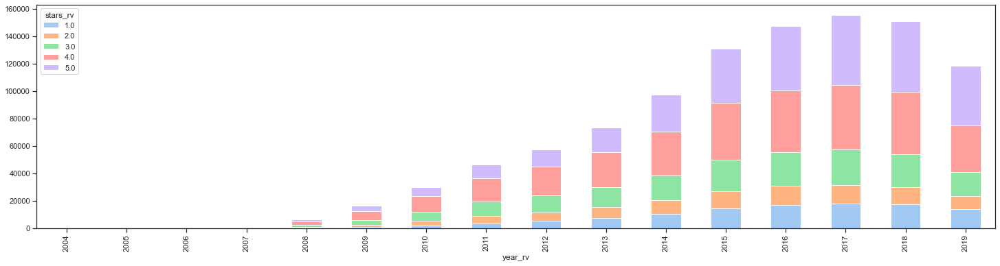

In [84]:
rv_df.groupby(['year_rv','stars_rv'])['qtde_rv'].agg('sum').unstack('stars_rv').plot(kind = 'bar', stacked = True, figsize = (25,6))

In [85]:
bf2 = spark.sql('''
                SELECT A.*,
                B.categories,
                B.latitude,
                B.longitude,
                B.name,
                B.review_count,
                B.stars,
                B.AcceptsInsurance,
                B.AgesAllowed,
                B.Alcohol,
                B.BYOB,
                B.BikeParking,
                B.BusinessAcceptsCreditCards,
                B.ByAppointmentOnly,
                B.Caters,
                B.CoatCheck,
                B.Corkage,
                B.DogsAllowed,
                B.DriveThru,
                B.GoodForDancing,
                B.GoodForKids,
                B.HappyHour,
                B.HasTV,
                B.NoiseLevel,
                B.OutdoorSeating,
                B.RestaurantsAttire,
                B.RestaurantsDelivery,
                B.RestaurantsGoodForGroups,
                B.RestaurantsPriceRange2,
                B.RestaurantsReservations,
                B.RestaurantsTableService,
                B.RestaurantsTakeOut,
                B.Smoking,
                B.WheelchairAccessible,
                B.WiFi,
                B.tips_counter_bz,
                B.total_compliments_bz
                
                FROM bf1 as A 
                RIGHT JOIN bz as B
                ON A.business_id = B.business_id
                
                WHERE year_rv >= 2017
                
                ''')

In [86]:
bf2.createOrReplaceTempView('bf2')

In [87]:
spark.sql('''
            SELECT 
            COUNT(DISTINCT business_id)
            FROM bf2
            ''').show()

+---------------------------+
|count(DISTINCT business_id)|
+---------------------------+
|                      13428|
+---------------------------+



- A seguir está a estrutura de dados de entrada no Modelo:

In [88]:
bf2.columns

['user_id',
 'average_stars',
 'compliment_cool',
 'compliment_cute',
 'compliment_funny',
 'compliment_hot',
 'compliment_list',
 'compliment_more',
 'compliment_note',
 'compliment_photos',
 'compliment_plain',
 'compliment_profile',
 'compliment_writer',
 'cool',
 'elite_count',
 'fans',
 'friends_count',
 'funny',
 'review_count_usr',
 'useful',
 'year_since',
 'tips_counter',
 'total_compliments',
 'cluster_usr',
 'business_id',
 'stars_rv',
 'year_rv',
 'categories',
 'latitude',
 'longitude',
 'name',
 'review_count',
 'stars',
 'AcceptsInsurance',
 'AgesAllowed',
 'Alcohol',
 'BYOB',
 'BikeParking',
 'BusinessAcceptsCreditCards',
 'ByAppointmentOnly',
 'Caters',
 'CoatCheck',
 'Corkage',
 'DogsAllowed',
 'DriveThru',
 'GoodForDancing',
 'GoodForKids',
 'HappyHour',
 'HasTV',
 'NoiseLevel',
 'OutdoorSeating',
 'RestaurantsAttire',
 'RestaurantsDelivery',
 'RestaurantsGoodForGroups',
 'RestaurantsPriceRange2',
 'RestaurantsReservations',
 'RestaurantsTableService',
 'RestaurantsT

In [89]:
bf2.write \
    .format('csv') \
    .mode('overwrite') \
    .option('sep', ',') \
    .option('header', True) \
    .save('output/yelp.csv')

## Reviews

- Como próximos passos, seria interessante entender melhor as características de cada cluster.
- Para entender melhor a natureza de cada cluster de usuários definida no R, utilizamos a nuvem de palavras para encontrar similaridade de perfil.

### Tratamento do texto

In [90]:
#Função para remoção de pontuação e tratamento das palavras
def word_clean(sdf,col,new_col):
    rv1 = sdf.withColumn(new_col,f.regexp_replace(f.col(col), "'d", " would"))
    rv2 = rv1.withColumn(new_col,f.regexp_replace(f.col(new_col), "'ve", " have"))
    rv3 = rv2.withColumn(new_col,f.regexp_replace(f.col(new_col), "'s", " is"))
    rv4 = rv3.withColumn(new_col,f.regexp_replace(f.col(new_col), "'re", " are"))
    rv5 = rv4.withColumn(new_col,f.regexp_replace(f.col(new_col), "n't", " not"))
    rv6 = rv5.withColumn(new_col,f.regexp_replace(f.col(new_col), '\W+', " "))
    rv7 = rv6.withColumn(new_col,f.lower(f.col(new_col)))
    return rv7

In [91]:
rv_raw.columns

['business_id',
 'cool',
 'date',
 'funny',
 'review_id',
 'stars',
 'text',
 'useful',
 'user_id']

In [92]:
usr_clusters2.createOrReplaceTempView('usr_clusters2')
rv_raw.createOrReplaceTempView('rv_raw')

In [93]:
spark.sql('''
                SELECT 
                count(*)
           
                FROM rv_raw 
                
                ''').show()

+--------+
|count(1)|
+--------+
| 8021122|
+--------+



In [94]:
words = spark.sql('''
                SELECT
                A.review_id,
                A.business_id,
                A.user_id,
                A.text,                
                max(B.text) as text_tp
           
                FROM rv_raw as A
                
                LEFT JOIN tp as B
                ON A.user_id = B.user_id and A.business_id = B.business_id
                
                GROUP BY 1, 2, 3, 4
                
                ''')

In [95]:
words.createOrReplaceTempView('words')

In [96]:
spark.sql('''
                SELECT 
                count(*)
           
                FROM words
                
                ''').show()

+--------+
|count(1)|
+--------+
| 8021122|
+--------+



In [97]:
bz.columns

['address',
 'business_id',
 'categories',
 'city',
 'is_open',
 'latitude',
 'longitude',
 'name',
 'postal_code',
 'review_count',
 'stars',
 'state',
 'Friday',
 'Monday',
 'Saturday',
 'Sunday',
 'Thursday',
 'Tuesday',
 'Wednesday',
 'AcceptsInsurance',
 'AgesAllowed',
 'Alcohol',
 'Ambience',
 'BYOB',
 'BYOBCorkage',
 'BestNights',
 'BikeParking',
 'BusinessAcceptsBitcoin',
 'BusinessAcceptsCreditCards',
 'BusinessParking',
 'ByAppointmentOnly',
 'Caters',
 'CoatCheck',
 'Corkage',
 'DietaryRestrictions',
 'DogsAllowed',
 'DriveThru',
 'GoodForDancing',
 'GoodForKids',
 'GoodForMeal',
 'HairSpecializesIn',
 'HappyHour',
 'HasTV',
 'Music',
 'NoiseLevel',
 'Open24Hours',
 'OutdoorSeating',
 'RestaurantsAttire',
 'RestaurantsCounterService',
 'RestaurantsDelivery',
 'RestaurantsGoodForGroups',
 'RestaurantsPriceRange2',
 'RestaurantsReservations',
 'RestaurantsTableService',
 'RestaurantsTakeOut',
 'Smoking',
 'WheelchairAccessible',
 'WiFi']

In [98]:
words2 = spark.sql('''
                SELECT A.*
                
                FROM bz22 as B
                LEFT JOIN words as A

                ON A.business_id = B.business_id
                                
                ''')

In [99]:
words2.count()

481658

In [100]:
words2.createOrReplaceTempView('words2')

In [101]:
words3 = spark.sql('''
                SELECT A.*,
                B.cluster_usr
                
                FROM words2 as A
                LEFT JOIN usr_clusters2 as B

                ON A.user_id = B.user_id
                                
                ''')

In [102]:
words3.count()

481658

- Chama a função para limpar os textos definida anteriormente

In [103]:
words4 = word_clean(words3,'text','text_clean')
words5 = word_clean(words4,'text_tp','text_clean_tp')

In [104]:
words5.show(4)

+--------------------+--------------------+--------------------+--------------------+-------+-----------+--------------------+-------------+
|           review_id|         business_id|             user_id|                text|text_tp|cluster_usr|          text_clean|text_clean_tp|
+--------------------+--------------------+--------------------+--------------------+-------+-----------+--------------------+-------------+
|QfGRzYeTGwZReGXO7...|478TIlfHXfT3wvww5...|-4Anvj46CWf57KWI9...|My friend and I s...|   null|          3|my friend and i s...|         null|
|SwFpvyHau8KSyHAfC...|MlKNIbEM-JL9WesSd...|-BUamlG3H-7yqpAl1...|Horrible customer...|   null|          7|horrible customer...|         null|
|bssWq2Anohi5HtuXR...|Ze4VPogvcD7inc3Qu...|-CGdueQKCHM_KnHxO...|Horrible service....|   null|         10|horrible service ...|         null|
|uYdh1LRp0CSuT5EJW...|djKTruHtS4n_vlfOk...|-JBB4-ALR07J6Pbx4...|This place has a ...|   null|          9|this place has a ...|         null|
+------------

In [105]:
from pyspark.sql.functions import split, regexp_replace, col, split, stddev, regexp_replace

words6 = words5.select("cluster_usr", split(
    "text_clean", r"[\s.]+").alias("text2"), split("text_clean_tp", r"[\s.]+").alias("text_tp2"))

- Utiliza a função nativa do PySpark `STOPWORDS REMOVER` para remoção de "palavras de parada" que não contribuirão na análise das palavras por não transmitirem significados para os clusters. 

In [106]:
#Configuração de idioma do Java que afeta o pacote StopWords
locale = sc._jvm.java.util.Locale
locale.setDefault(locale.forLanguageTag("en-US"))

In [107]:
remover = StopWordsRemover(inputCol="text2", outputCol="text_filtered")
words7 = remover.transform(words6)

words7.show(5)

+-----------+--------------------+--------+--------------------+
|cluster_usr|               text2|text_tp2|       text_filtered|
+-----------+--------------------+--------+--------------------+
|          3|[my, friend, and,...|    null|[friend, stopped,...|
|          7|[horrible, custom...|    null|[horrible, custom...|
|         10|[horrible, servic...|    null|[horrible, servic...|
|          9|[this, place, has...|    null|[place, special, ...|
|          9|[my, favourite, f...|    null|[favourite, food,...|
+-----------+--------------------+--------+--------------------+
only showing top 5 rows



In [108]:
from pyspark.sql.functions import concat_ws

words8 = words7.select("cluster_usr", "text_filtered", 
                 concat_ws(' ',  "text_filtered").alias("text_filtered2")) 

In [109]:
words9 = words8.withColumn('wordCount', f.size(f.split(f.col('text_filtered2'),' ')))

In [110]:
words10 = words9.withColumn('word', f.explode(f.split(f.col('text_filtered2'), ' ')))\
            .groupBy('word','cluster_usr')\
            .count()\
            .sort('count', ascending = False)
words10.show()

+-------+-----------+-----+
|   word|cluster_usr|count|
+-------+-----------+-----+
|       |         10|99121|
|       |          3|97713|
|       |          4|75191|
|   food|          3|68843|
|       |          8|68700|
|       |          9|67361|
|   food|         10|62467|
|  place|         10|60948|
|   good|         10|60478|
|   good|          3|59514|
|  place|          3|56070|
|   good|          8|51687|
|  place|          8|49572|
|   food|          8|46318|
|   like|         10|45073|
|  great|         10|44976|
|service|          3|44575|
|   food|          4|43592|
|   food|          9|42205|
|  place|          4|41867|
+-------+-----------+-----+
only showing top 20 rows



In [115]:
words10.createOrReplaceTempView('words10')

In [116]:
cls = []
#for i in tqdm(range(1, 11)): # Biblioteca que apresenta a evolução do tempo de processamento, mas não está instalada no servidor AWS
for i in range(1, 11):
    cls.append(spark.sql(f'''
        SELECT   word, 
                 count 
        FROM     words10 
        WHERE    word IS NOT NULL 
        AND      cluster_usr == {i} 
        ORDER BY count DESC limit 50
        '''))
    cls[i-1] = [tuple(x) for  x in cls[i-1].toPandas().to_numpy()]

Cluster 1


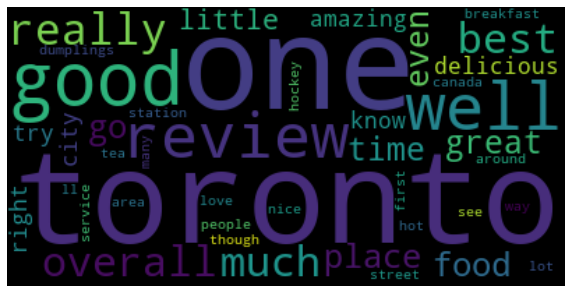

Cluster 2


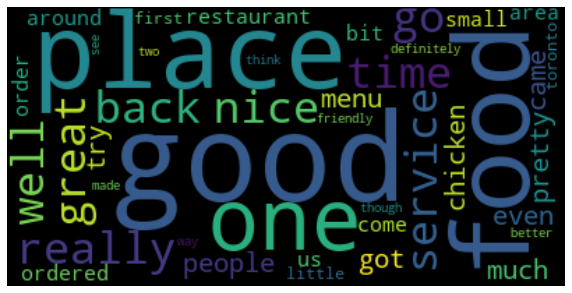

Cluster 3


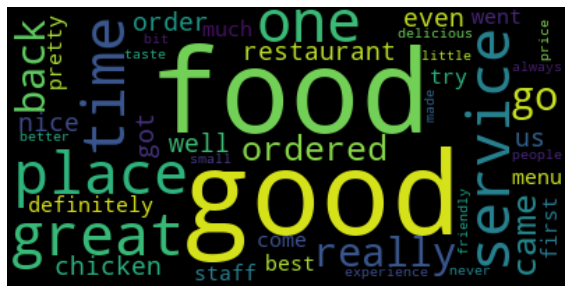

Cluster 4


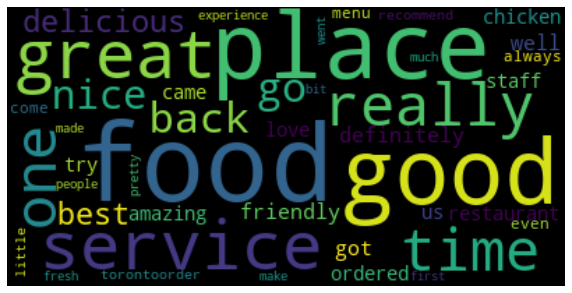

Cluster 5


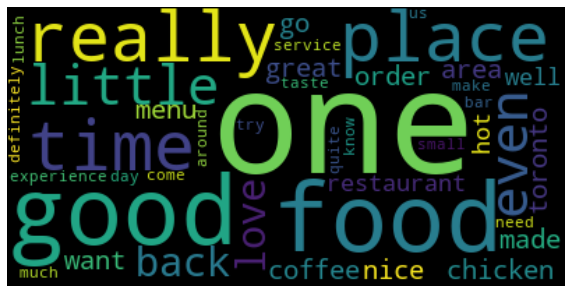

Cluster 6


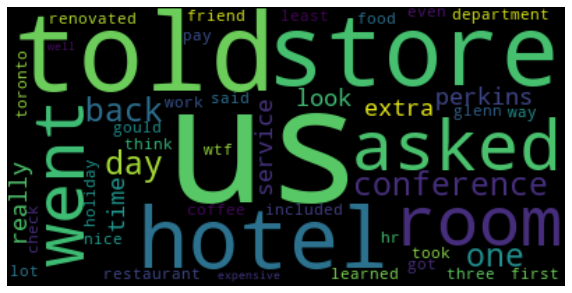

Cluster 7


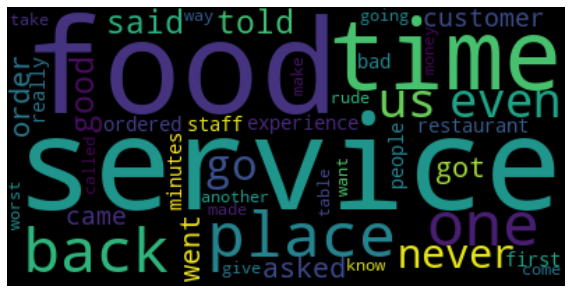

Cluster 8


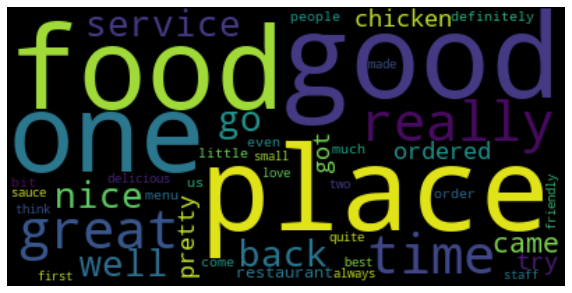

Cluster 9


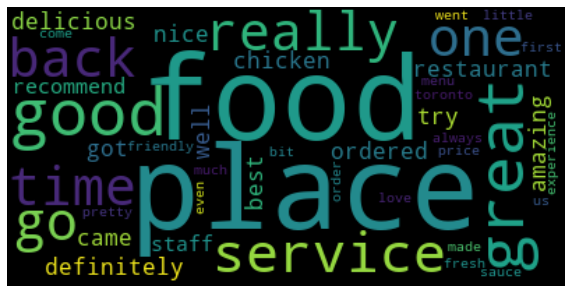

Cluster 10


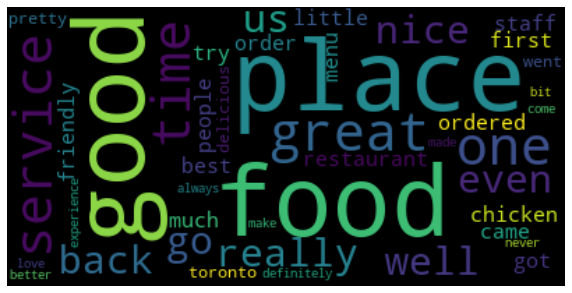

In [119]:
cluster = 1
for cl in cls:
    print(f"Cluster {cluster}")
    plt.figure(figsize=(10, 10))
    plt.imshow(WordCloud().generate(str(cl).replace("'", "")), interpolation='bilinear')
    plt.axis('off')
    plt.show()
    cluster += 1

- Observamos que a maior parte dos cluster estão relacionados ao setor de alimentos e restaurantes com palavras em comum como "Food", "good", "chicken", "delicious", ...
- No cluster 6, observamos uma natureza relativamente diferente com aparecimento de palavras como "hotel", "holiday", "store", "conference" dando a impressão de ser um cluster de turistas. 

## Heatmap

- Criando mapa de calor da concentração de reviews

In [120]:
base_mapas = spark.sql('''
                SELECT A.*, B.latitude, B.longitude
                
                FROM bz22 as B
                LEFT JOIN words as A

                ON A.business_id = B.business_id
                                
                ''')

In [121]:
base_mapas.columns

['review_id',
 'business_id',
 'user_id',
 'text',
 'text_tp',
 'latitude',
 'longitude']

In [122]:
base_mapas.createOrReplaceTempView('base_mapas')

In [123]:
mapa1 = spark.sql("""
        SELECT latitude,
        longitude
        
        FROM base_mapas
        
        WHERE latitude is not null
        AND longitude is not null
        
        """)

Decobrindo o ponto central de Latitude e Longetude do Mapa

In [124]:
spark.sql("""
         SELECT avg(latitude) as avg_lat,
         avg(longitude) as avg_long
       
         FROM base_mapas
       
         """).show()

+-----------------+------------------+
|          avg_lat|          avg_long|
+-----------------+------------------+
|43.67367342472855|-79.39164235047365|
+-----------------+------------------+



In [125]:
import folium
from folium import plugins

mapa = folium.Map(location=[43.673, -79.391], 
                  zoom_start=11,
                  tiles='Stamen Toner')
# OpenStreetMap, Stamen Terrain, Stamen Toner

In [126]:
mapa

lat = mapa1.toPandas()['latitude'].values
lon = mapa1.toPandas()['longitude'].values

In [127]:
coordenadas = []
for la, lo in zip(lat, lon):
    coordenadas.append([la,lo])
mapa.add_child(plugins.HeatMap(coordenadas))

- Analisando o mapa de Toronto, observa-se uma grande concetração de estabelecimentos numa área localiazda no sul da cidade e muitas ruas com concetração de estabelecimentos.
- Essa área passa a impressão de ser o centro da cidade, uma região em que os integrantes do grupo considerariam para procurar hospedagem numa eventual viagem. 

# Conclusão

Foram avaliadas todas as bases do dataset, mas nem todas as informações disponíveis foram utilizadas no modelo de redes neurais do sistema de recomendação. Após entender com uma análise de componentes principais o impacto dos atributos dos estabelecimentos na nota, foi feita uma clusterização dos usuários para identificar os perfis semelhantes e utilizar os locais frequentados como base para as recomendações. Dessa forma, foi elaborado um classificador para indicação de estabelecimentos por diferentes categorias, de acordo com o que o usuário desejasse visitar. 

##  Oportunidades de melhorias:
 1. Utilizar as informações de movimento dos estabelecimentos e cruzá-la com os horários em que as avaliações foram feitas.
 2. Incluir texto de reviews e tips no modelo pela presença de palavras palavras-chave, por modelos de tópicos, por uma análise de sentimentos, ou por "encoding" do texto completo.
 3. Criar interface de usuários com Shiny (R).
 4. Replicar o algoritmo para outras cidades e estabelecendo 
 5. Utilizar a localização do usuário na busca por recomendação.
     



# Referências

- Neumann, D. Material de aula do cursos Big Data e Computação em Nuvem
- Mendonça, T. Material de aula do curso Modelagem Preditiva Avançada
- [Documentação PySpark](http://spark.apache.org/docs/latest/api/python/pyspark.sql.html)
- [StackOverflow](https://stackoverflow.com) - base colaborativa de programadores para solução de erros
- [Fernandez, P. Marques. P. Data Science, Marketing and Business](https://datascience.insper.edu.br/datascience.pdf)
- [Rahimi, S.; Mottahedi, S.; Liu, X. The Geography of Taste: Using Yelp to Study Urban Culture. ISPRS Int. J. Geo-Inf. 2018, 7, 376.](https://www.mdpi.com/2220-9964/7/9/376?type=check_update&version=1)
- [Chollet, F. et al, Deep Learning with R](https://www.manning.com/books/deep-learning-with-r)
- [Silge, J., Topic modeling of Sherlock Holmes stories](https://juliasilge.com/blog/sherlock-holmes-stm/)
- https://www.datanovia.com/en/lessons/clustering-distance-measures/
- [K-means clustering with tidy data principles](https://www.tidymodels.org/learn/statistics/k-means/)

- Arquivos disponíveis no [repositório](https://github.com/sanchezvivi/pads-yelp)